## Load and Process Image

In [65]:
import cv2
import numpy as np
import plotly.express as px
import csv

n = 4
#proteins that exist in our sample
proteins = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 16, 18, 19, 20, 21, 22, 23, 24, 25, 26]
number_of_proteins = len(proteins)

#files dictionary
datafiles = {}
for i in proteins:
    datafiles[i] = []

with open("Data_in_use_" + str(n) + ".csv", 'r') as f:
    reader = csv.reader(f, delimiter=',')
    for row in reader:
        if row[0] != "Id":
            datafiles[int(row[1])].append(row[0])    

#number of samples per protein
number_of_samples = len(datafiles[0])
print("Number of samples per protein: " + str(number_of_samples))

Number of samples per protein: 4


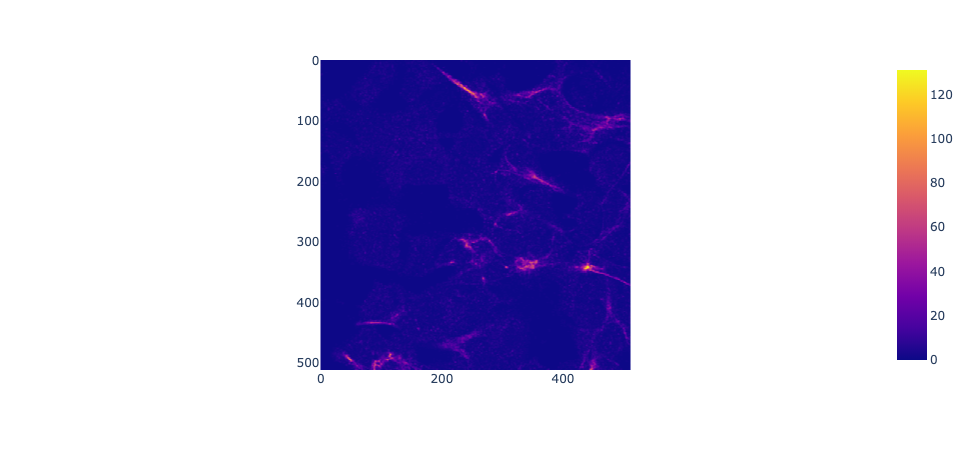

In [66]:
# Read RGB image 
img = cv2.imread("data/" + datafiles[11][0] + "_green.png")  
  
# Output img with window name as 'img' 
img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# blur the image to reduce noise
figure_size = 3 # the dimension of the x and y axis of the kernal.
img = cv2.blur(img,(figure_size, figure_size))
px.imshow(img)

In [38]:
shape = img.shape
images = np.zeros((number_of_samples * len(proteins), *shape))
len(datafiles[1])

4

In [39]:
# Load up images to the variable images as one long array
j = 0
for protein in datafiles:
    for i in range(len(datafiles[protein])):
        img = cv2.imread("data/" + datafiles[protein][i] + "_green.png")
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        figure_size = 3 # the dimension of the x and y axis of the kernal.
        img = cv2.blur(img,(figure_size, figure_size))
        images[j] = img
        j = j+1

## Convert image to binary

In [40]:
from gtda.images import HeightFiltration, RadialFiltration, \
DilationFiltration, ErosionFiltration, SignedDistanceFiltration, Binarizer
                         
bz = Binarizer(threshold=10/255)
binned = bz.fit_transform(images)

(96, 512, 512)


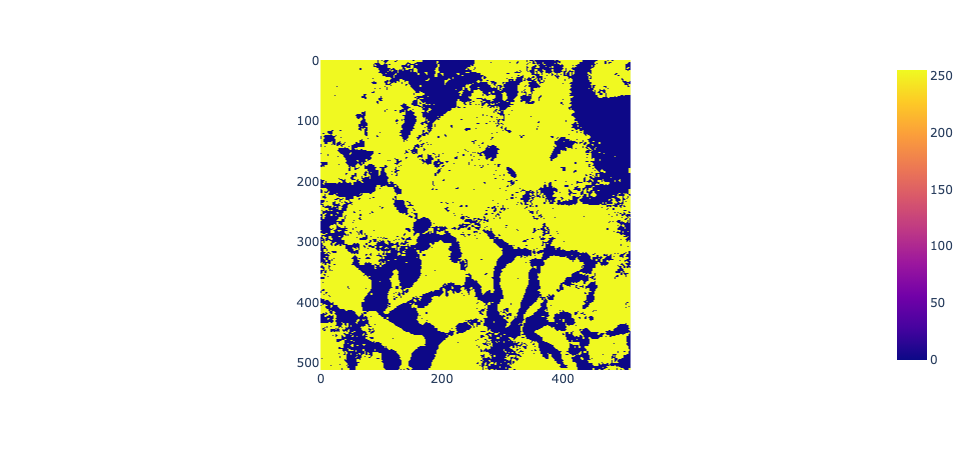

In [41]:
print(binned.shape)
px.imshow(binned[0])

In [42]:
from gtda.pipeline import make_pipeline
from gtda.diagrams import BettiCurve
from gtda.homology import CubicalPersistence
from gtda.diagrams import PersistenceEntropy

# p = make_pipeline(HeightFiltration(direction=np.array([1,1])), CubicalPersistence(), BettiCurve())
# for protein in range(len(binned)):
#    p.fit_transform(binned[protein])

## Pipline above  broken down into individual steps

In [43]:
# Making a bunch of height filtrations
directions =  np.asarray([[1,1],[1,0],[0,1],[1,-1]])
hf_images = np.zeros((len(directions),*images.shape))

for i in range(len(directions)):
    HFiltration = HeightFiltration(direction=np.array(directions[i]))
    hf_images[i] = HFiltration.fit_transform(binned)


In [44]:
hf_images.shape
# indexed by (direction, image, picturex2)

(4, 96, 512, 512)

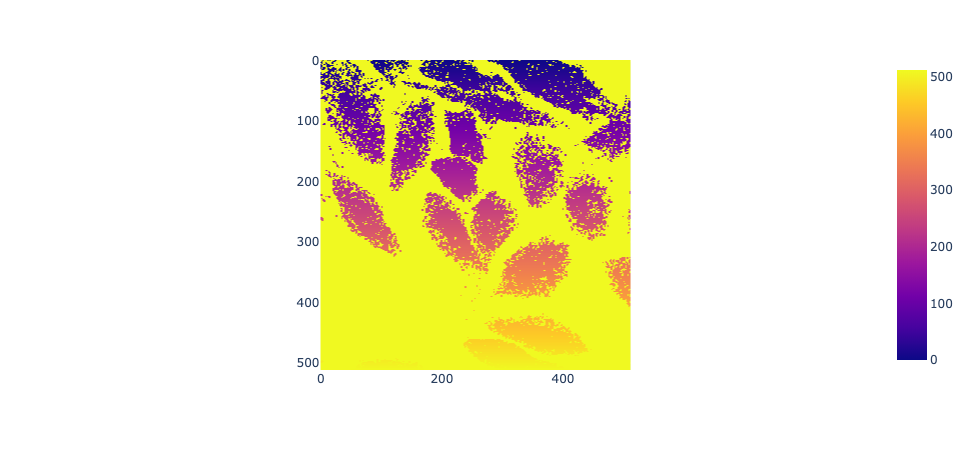

In [45]:
px.imshow(hf_images[2][8])

## Making the height filtrations and the persistence entropies directly because I can't figure out how to pad arrays :/

In [46]:
cp = CubicalPersistence()
pe = PersistenceEntropy()
presistence_entropies = np.empty((len(directions), number_of_proteins * number_of_samples, 2))

for i in range(len(directions)):
    current_set_of_filtrations = hf_images[i]
    # print(type(current_set_of_filtrations))
    # print(current_set_of_filtrations.shape)
    current_barcodes = cp.fit_transform(current_set_of_filtrations)
    current_pe = pe.fit_transform(current_barcodes)
    print(type(current_pe))
    print(current_pe.shape)
    print(current_pe)
    presistence_entropies[i] = current_pe
    print(str(i * 25) + "% done")

<class 'numpy.ndarray'>
(96, 2)
[[ 5.76984279  6.73786728]
 [ 5.62428936  5.29001082]
 [ 6.49626339  5.2447334 ]
 [ 4.84077429  5.13166792]
 [ 4.9272054   5.80394413]
 [ 6.10158666  5.67929435]
 [ 6.4477411   4.39136763]
 [ 6.6431958   5.88656524]
 [ 6.25225287  7.22692167]
 [ 6.14871015  5.21431606]
 [ 3.97961684 -0.        ]
 [ 5.542725    7.02187894]
 [ 3.0819117  -0.        ]
 [ 6.28450983  7.8421069 ]
 [ 4.38555739  4.96596524]
 [ 4.47123634 -0.        ]
 [ 5.13762614  6.57516497]
 [ 3.43761211  2.86949856]
 [ 4.84066549  3.72762542]
 [ 4.91889081  5.41069682]
 [ 4.92692297  5.37350652]
 [ 4.04141343  4.53384692]
 [ 4.8690173   5.17844953]
 [ 6.09043191  2.48919709]
 [ 5.60881917  4.9728294 ]
 [ 6.27970146  6.73705492]
 [ 3.70614278  4.96781948]
 [ 5.16147199  6.28526868]
 [ 6.15975728  6.11477388]
 [ 7.0763347   6.72827296]
 [ 6.06161078  6.6085246 ]
 [ 5.99528148  2.58730632]
 [ 5.927523    6.9416559 ]
 [ 6.31180536  4.51534399]
 [ 6.15478602  3.71860435]
 [ 6.25159866  6.987544

In [67]:
# check out this boy's shape
print(presistence_entropies.shape)

(4, 96, 2)


## Creating a Pandas dataframe to feed to the random forests algorithm

In [68]:
import pandas as pd
import math
number_of_features = len(directions) * 2 # for h0 and h1 PEs

# set up numpy array to convert
to_convert = np.empty(((len(presistence_entropies[0])),number_of_features + 1))
for direction in range(len(presistence_entropies)):
    for picture in range(len(presistence_entropies[direction])):
        to_convert[picture][-1] = int(math.floor(picture / number_of_samples))
        for homology in range(len(presistence_entropies[direction][picture])):
            to_convert[picture][(direction*2)+homology] = presistence_entropies[direction][picture][homology] 
            
print(to_convert)

[[ 5.76984279  6.73786728  5.6713378   6.62890723  5.62334511  6.66815652
   5.74903087  6.71939211  0.        ]
 [ 5.62428936  5.29001082  5.62388052  5.30642366  5.44822947  5.18912234
   5.63671987  5.35109022  0.        ]
 [ 6.49626339  5.2447334   6.44204807  5.19799689  6.40292794  5.13016101
   6.53680471  5.23806378  0.        ]
 [ 4.84077429  5.13166792  4.76267543  5.00338744  4.8083455   5.11792032
   4.92754184  5.2810627   0.        ]
 [ 4.9272054   5.80394413  4.776181    5.61926729  4.8825298   5.70405574
   4.87558566  5.73271159  1.        ]
 [ 6.10158666  5.67929435  6.03456008  5.63662639  5.98874842  5.52021279
   6.10533458  5.65816336  1.        ]
 [ 6.4477411   4.39136763  6.36414277  3.99735715  6.33414071  4.39639187
   6.43880486  4.32608394  1.        ]
 [ 6.6431958   5.88656524  6.54024221  5.77981975  6.5522233   5.79928223
   6.61202172  5.89576494  1.        ]
 [ 6.25225287  7.22692167  6.12936871  7.12688779  6.24051418  7.19114387
   6.26015294  7.20680

In [54]:
df = pd.DataFrame(data=to_convert, columns = ["h1hom0", "h1hom1", "h2hom0", "h2hom1", "h3hom0", "h3hom1", "h4hom0", "h4hom1", "protein"])
print(df.head)

<bound method NDFrame.head of       h1hom0    h1hom1    h2hom0    h2hom1    h3hom0    h3hom1    h4hom0  \
0   5.769843  6.737867  5.671338  6.628907  5.623345  6.668157  5.749031   
1   5.624289  5.290011  5.623881  5.306424  5.448229  5.189122  5.636720   
2   6.496263  5.244733  6.442048  5.197997  6.402928  5.130161  6.536805   
3   4.840774  5.131668  4.762675  5.003387  4.808345  5.117920  4.927542   
4   4.927205  5.803944  4.776181  5.619267  4.882530  5.704056  4.875586   
..       ...       ...       ...       ...       ...       ...       ...   
91  5.360382  5.005933  5.222324  4.662869  5.263945  4.981028  5.436216   
92  6.771891  5.801107  6.660434  5.705745  6.738333  5.746544  6.726586   
93  5.696842  5.631317  5.615705  5.580057  5.604634  5.472068  5.653174   
94  5.621429  6.435362  5.367079  6.378974  5.566113  6.390454  5.479188   
95  6.662340  6.174485  6.510813  6.077220  6.576079  6.059114  6.587858   

      h4hom1  protein  
0   6.719392      0.0  
1   5.351

## Setting up the random forests classifier

In [69]:
# splitting into labels and data
X = df.iloc[:, 0:8].values
y = df.iloc[:, 8].values
print(type(X))
print(y)

<class 'numpy.ndarray'>
[ 0.  0.  0.  0.  1.  1.  1.  1.  2.  2.  2.  2.  3.  3.  3.  3.  4.  4.
  4.  4.  5.  5.  5.  5.  6.  6.  6.  6.  7.  7.  7.  7.  8.  8.  8.  8.
  9.  9.  9.  9. 10. 10. 10. 10. 11. 11. 11. 11. 12. 12. 12. 12. 13. 13.
 13. 13. 14. 14. 14. 14. 15. 15. 15. 15. 16. 16. 16. 16. 17. 17. 17. 17.
 18. 18. 18. 18. 19. 19. 19. 19. 20. 20. 20. 20. 21. 21. 21. 21. 22. 22.
 22. 22. 23. 23. 23. 23.]


In [56]:
print(X.shape)
print(y.shape)

(96, 8)
(96,)


In [70]:
# splitting into training and testing
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

In [71]:
# scaling the data 

from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [60]:
# scaling the data 

from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [61]:
print(X_train)

[[ 7.62316160e-01  1.19057172e+00  7.00386112e-01  1.20447166e+00
   7.57086882e-01  1.20428731e+00  7.53123848e-01  1.19646186e+00]
 [ 5.20537070e-01  1.04479912e+00  4.63205315e-01  1.06039080e+00
   5.51442307e-01  1.06108445e+00  4.66482825e-01  1.04683864e+00]
 [ 6.73724447e-01 -2.40656497e-01  6.86893871e-01 -3.88901050e-01
   6.45807409e-01 -1.98486599e-01  6.75537763e-01 -2.65073223e-01]
 [ 8.69452080e-01  5.94580466e-01  8.21173200e-01  5.93976254e-01
   8.66707998e-01  5.87920234e-01  8.11176185e-01  5.80783048e-01]
 [ 2.54902599e-01  6.03746221e-01  2.84428869e-01  6.19875101e-01
   2.43626997e-01  6.04461461e-01  2.82711990e-01  6.07024820e-01]
 [-2.74135367e+00 -1.47833319e+00 -2.78879312e+00 -1.52703178e+00
  -2.71610478e+00 -1.59261979e+00 -2.75252848e+00 -1.58479624e+00]
 [ 5.49507989e-01 -4.39691858e-01  5.33341168e-01 -4.40729403e-01
   5.25138257e-01 -4.09390222e-01  5.33096123e-01 -4.43800969e-01]
 [-1.85744538e+00 -2.29763440e+00 -1.78363946e+00 -2.27792522e+00
  -

In [62]:
from sklearn.ensemble import RandomForestClassifier

classifier = RandomForestClassifier(n_estimators=20, random_state=0)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)

In [63]:
print(y_pred.shape)
print(y_pred)

(24,)
[ 3. 11.  2.  3.  9. 13. 22.  8.  9.  8. 13. 18. 16. 12. 23.  9.  4.  0.
  1. 12.  4. 14.  4. 18.]


In [64]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))
print(accuracy_score(y_test, y_pred))

[[0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
 [0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0

/opt/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

